# Atividade Computacional: Fundamentos de Processamento de Imagens

**Aluno:** Fabiano Amaral Alves

## 1. Como executar

```
- Extrair o arquivo "AtividadePratica1.zip".
- O diretorio "dataset" contem as imagens do conjunto de dados.
- Ao executar a de carregamento das imangens, as mesmas serão selecionadas aleatoriamente
    - Se preferir pode carregar as imagens realizando seleção especifica de acordo codigo de exemplo nessa celula (linhas 1 e 2)
- Ao utilizar o google colab, é necessario extrair o arquivo "dataset.zip" para o diretorio do projeto.
```

O notebook e o dataset podem ser encontrados em [https://github.com/faamaral/processamento_imagens](https://github.com/faamaral/processamento_imagens)


## 2. Definição das classes

Para esta atividade foram selecionadas as classes **Camisa** e **Calça**. A definição das classes foi realizada seguindo o critério de disponibilidade de diferentes variações.

    > Para as classes escolhidas, cada peça pode apresentar caracteristicas unicas como variações de cor, tamanho, estampas e texturas.

## 3. Aquisição das imagens

Dispositivo utilizado: Smartphone Samsung SM-G780G
Filtros/Embelasamento: Desativados -> Utilizado camera em modo PRO, com ajustes de ISO, Tempo de exposição, entre outros.
Luminosidade: Algumas das imagens foram feitas durante o dia com luz natural, já outras durante a noite com iluminação do ambiente com lampadas de LED ou baixa iluminação.
Distância/Angulo: As fotos foram tiradas a uma distancia entre o objeto principal e o dispositivo de aproximadamente 70 ou 80 centimetros, pois a ideia é capturar o objeto inteiro sendo capaz de obter detalhes de textura presentes no objeto.


| Imagem                                                       | Nome do Arquivo | Classe | Distância | Luminosidade  | Flash      | ISO | Tempo de Exposição |    Ruido/Desfoque |
|--------------------------------------------------------------|-----------------|--------|-----------|---------------|------------|---|--------------------|------------------:|
| <img src="dataset/camisa/camisa1.jpg" width="30px"> | camisa1.jpg     | Camisa | ≈80cm     | Luz Natural   | Não        | 125 | 1/30s              | Não |
| <img src="dataset/camisa/camisa2.jpg" width="30px" height="30"> | camisa2.jpg     | Camisa | ≈80cm      | Sombra/Escuro | Não        | 1600 | 1/8s               | Serrilhamento |
| <img src="dataset/camisa/camisa3.jpg" width="30px" height="30"> | camisa3.jpg     | Camisa | ≈80cm      | Luz Sintetica | Sim        | 160 | 1/10s              | Não Detectado |
| <img src="dataset/camisa/camisa4.jpg" width="30px" height="30"> | camisa4.jpg     | Camisa | ≈80cm      | Luz Sintetica | Não        | 320 | 1/30s              | Não |
| <img src="dataset/camisa/camisa5.jpg" width="30px" height="30"> | camisa5.jpg     | Camisa | ≈80cm      | Sombra/Escuro | Não        | 1250 | 1/5s               | Serrilhamento |
| <img src="dataset/calca/calca1.jpg" width="30px" height="30">  | calca1.jpg      | Calça  | ≈80cm      | Luz Natural   | Não        | 160 | 1/15s              | Não Detectado |
| <img src="dataset/calca/calca2.jpg" width="30px" height="30">  | calca2.jpg      | Calça  | ≈80cm      | Luz Sintetica | Não        | 320 | 1/25s              | Não |
| <img src="dataset/calca/calca3.jpg" width="30px" height="30">  | calca3.jpg      | Calça  | ≈80cm      | Luz Natural   | Não | 250 | 1/15s              | Serrilhamento |
| <img src="dataset/calca/calca4.jpg" width="30px" height="30">  | calca4.jpg      | Calça  | ≈80cm      | Luz Sintetica | Não | 320 | 1/15s              | Não |
| <img src="dataset/calca/calca5.jpg" width="30px" height="30">  | calca5.jpg      | Calça  | ≈80cm      | Sombra/Escuro | Não | 1250 | 1/4s               | Serrilhamento |

O dataset está estruturado por classes como exibido abaixo:

```text
dataset/
├── camisa/
│   ├── camisa1.jpg
│   ├── camisa2.jpg
│   ├── camisa3.jpg
│   ├── camisa4.jpg
│   └── camisa5.jpg
└── calca/
    ├── calca1.jpg
    ├── calca2.jpg
    ├── calca3.jpg
    ├── calca4.jpg
    └── calca5.jpg
```


## 4. Preparação do ambiente

In [6]:
# Instalação das bibliotecas Matplotlib e OpenCV
!pip install -q matplotlib
!pip install -q opencv-python

print("Dependencias instaladas!")

Dependencias instaladas!


In [7]:
!unzip dataset.zip

Archive:  dataset.zip
   creating: dataset/
   creating: dataset/calca/
  inflating: dataset/calca/calca1.jpg  
  inflating: dataset/calca/calca2.jpg  
  inflating: dataset/calca/calca3.jpg  
  inflating: dataset/calca/calca4.jpg  
  inflating: dataset/calca/calca5.jpg  
   creating: dataset/camisa/
  inflating: dataset/camisa/camisa1.jpg  
  inflating: dataset/camisa/camisa2.jpg  
  inflating: dataset/camisa/camisa3.jpg  
  inflating: dataset/camisa/camisa4.jpg  
  inflating: dataset/camisa/camisa5.jpg  


In [8]:
import os
import secrets
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from enum import StrEnum
from PIL.ExifTags import TAGS

print("Tudo OK!")
print("Bibliotecas importadas!")


Tudo OK!
Bibliotecas importadas!


#### Funções uteis para o desenvolvimento da atividade

In [9]:
class Classe(StrEnum):
    CAMISA = "Camisa"
    CALCA = "Calça"


def get_caminho_output(nome_arquivo: str, nome_pasta: str = "output") -> str:
    """ Obtem o caminho para um arquivo.

    Args:
        nome_arquivo (str): nome do arquivo
        nome_pasta (str, optional): nome do pasta. Defaults to "output".

    Returns:
        str: caminho do arquivo
    """
    if not os.path.exists(nome_pasta):
        os.makedirs(nome_pasta)  # se a pasta especificada ainda não existir, a mesma é criada
    return os.path.join(nome_pasta, nome_arquivo)


def get_imagem_matriz(classe: Classe) -> np.ndarray:
    """Obtem uma imagem em formato de matriz numpy

    Args:
        classe (Classe): classe da imagem

    Returns:
        np.ndarray: imagem em formato de matriz
    """
    if classe == Classe.CAMISA:
        # seleciona uma imagem do dataset de modo aleatorio
        return np.array(Image.open(get_caminho_output(f"camisa{np.random.randint(1, 6)}.jpg", "dataset/camisa")))
    return np.array(Image.open(get_caminho_output(f"calca{np.random.randint(1, 6)}.jpg", "dataset/calca")))


## 5. Carregamento da imagem

As imagens são escolhidas de forma aleatoria através da função `get_imagem_matriz`.

Após carregar a imagem, exibimos informações presentes na imagem.

 ------- Camisa --------
Shape: (3024, 4032, 3)
Dtype: uint8
Valor mínimo: 0
Valor máximo: 124
Pixel RGB escolhido aleatoriamente: [34 33 31]
R: 34
G: 33
B: 31
-----------------------------

 ------- Calça --------
Shape: (3024, 4032, 3)
Dtype: uint8
Valor mínimo: 0
Valor máximo: 255
Pixel RGB escolhido aleatoriamente: [189 192 183]
R: 189
G: 192
B: 183
-----------------------------



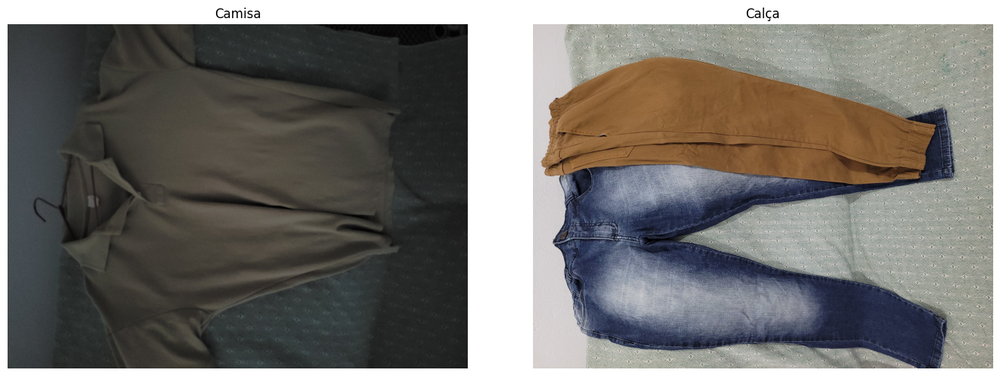

In [10]:
#imagem_camisa_rgb = np.array(Image.open("dataset/camisa/camisa1.jpg"))
#imagem_calca_rgb = np.array(Image.open("dataset/calca/calca1.jpg"))

imagem_camisa_rgb = get_imagem_matriz(Classe.CAMISA)
imagem_calca_rgb = get_imagem_matriz(Classe.CALCA)

fig, eixos = plt.subplots(1, 2, figsize=(14, 5))
for coluna, classe in enumerate([Classe.CAMISA, Classe.CALCA]):
    imagem_aux = imagem_camisa_rgb if classe == Classe.CAMISA else imagem_calca_rgb
    eixos[coluna].imshow(imagem_aux)
    eixos[coluna].set_title(classe)
    eixos[coluna].axis("off")

    print(f" ------- {classe} --------")
    print("Shape:", imagem_aux.shape)  # Exibe altura, largura e quantidade de canais da imagem.
    print("Dtype:", imagem_aux.dtype)  # Exibe o tipo numérico utilizado para armazenar cada componente de cor.
    print("Valor mínimo:", imagem_aux.min())  # Exibe o menor valor presente na matriz.
    print("Valor máximo:", imagem_aux.max())  # Exibe o maior valor presente na matriz.

    #Seleciona um pixel aleatorio e exibe cada canal RGB
    linha = np.random.randint(0, imagem_aux.shape[0])  # Define a linha do pixel que será inspecionado.
    coluna = np.random.randint(0, imagem_aux.shape[1])  # Define a coluna do pixel que será inspecionado.
    pixel = imagem_aux[linha, coluna]  # Obtém os três valores RGB presentes na coordenada selecionada.
    print("Pixel RGB escolhido aleatoriamente:", pixel)  # Exibe o vetor RGB correspondente ao pixel escolhido.
    print("R:", pixel[0])  # Exibe a componente vermelha do pixel.
    print("G:", pixel[1])  # Exibe a componente verde do pixel.
    print("B:", pixel[2])  # Exibe a componente azul do pixel.

    print("-----------------------------\n")

plt.tight_layout()
plt.show()

## 5. Transformações de imagens

### A. Analise de Resolução

Nesta etapa reduzimos a quantidade de pixels nas imagens, logo após ampliaremos as imagens para sua resolução original a partir da imagem reduzida.

A função `modifica_resolucao` possui a logica de redução e reampliação de imagens, o que permite ser utilizada em diferentes cenarios de redução de resolução sem repetir codigo.

In [11]:
def modifica_resolucao(imagem: np.ndarray, proporcao: float, classe: Classe) -> np.ndarray:
    """ Reduz e reamplia as dimensões espaciais da imagem mantendo o tamanho da visualização

    Args:
        imagem (np.ndarray): imagem em formato de matriz
        proporcao (float): proporção da redução em resolução da imagem
        classe: (Classe): classe da imagem

    Returns:
        np.ndarray: imagem em formato de matriz
    """
    altura, largura = imagem.shape[:2]

    porcentagem = np.round(100 * proporcao).astype(int)  # mostra a porcentagem da redução de resulução

    altura_reduzida = max(1, int(altura * proporcao))
    largura_reduzida = max(1, int(largura * proporcao))

    imagem_reduzida = cv2.resize(imagem, (largura_reduzida, altura_reduzida), interpolation=cv2.INTER_AREA)

    print(f"***** Classe {classe} *****")
    print(f"A imagem original possui {altura}px de altura e {largura}px de largura.")
    print("-----------------------------------------------")
    print(f"Redução da resulução para {porcentagem}% da resulução original!")
    print(
        f"A imagem reduzida para {porcentagem}% da resulução original possui {imagem_reduzida.shape[0]}px de altura e {imagem_reduzida.shape[1]}px de largura.")
    print(f"----------------------------------------------------------\n")

    imagem_reampliada = cv2.resize(imagem_reduzida, (largura, altura), interpolation=cv2.INTER_NEAREST)

    try:
        Image.fromarray(imagem_reampliada).save(get_caminho_output(
            f"{"camisa" if classe == Classe.CAMISA else "calca"}_rgb_reducao_{int(proporcao * 100)}.jpg",
            nome_pasta="output/resolucao"))
        print("Imagem reampliada salva com sucesso!\n")
    except Exception as e:
        print("Imagem não salva: \n", e)

    return imagem_reampliada




A seguir implementaremos os cenarios com redução em 50% e 20% da resolução original para cada uma das classes.

***** Classe Camisa *****
A imagem original possui 3024px de altura e 4032px de largura.
-----------------------------------------------
Redução da resulução para 50% da resulução original!
A imagem reduzida para 50% da resulução original possui 1512px de altura e 2016px de largura.
----------------------------------------------------------

Imagem reampliada salva com sucesso!

***** Classe Camisa *****
A imagem original possui 3024px de altura e 4032px de largura.
-----------------------------------------------
Redução da resulução para 20% da resulução original!
A imagem reduzida para 20% da resulução original possui 604px de altura e 806px de largura.
----------------------------------------------------------

Imagem reampliada salva com sucesso!

***** Classe Calça *****
A imagem original possui 3024px de altura e 4032px de largura.
-----------------------------------------------
Redução da resulução para 50% da resulução original!
A imagem reduzida para 50% da resulução original 

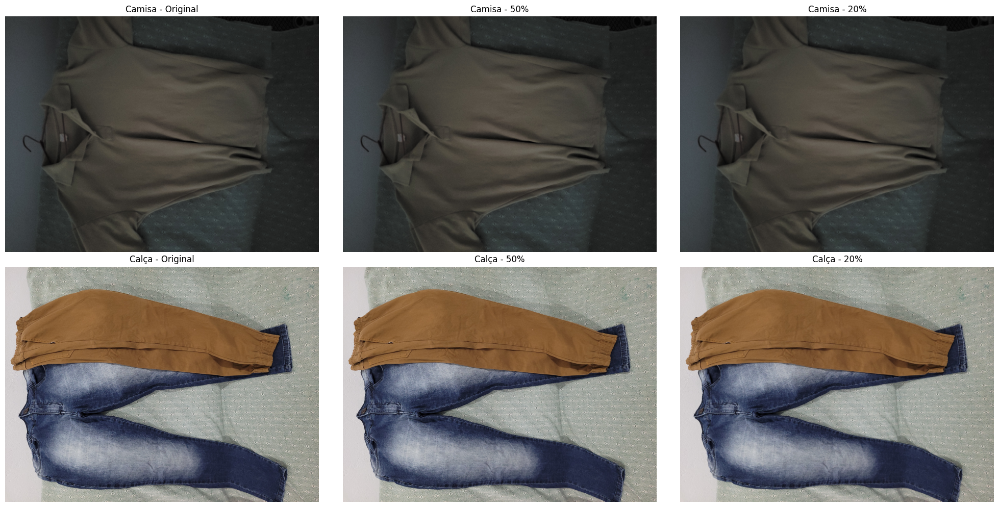

In [12]:
imagens_reampliadas = {
    Classe.CAMISA: [
        imagem_camisa_rgb,
        modifica_resolucao(imagem_camisa_rgb, (50 / 100), classe=Classe.CAMISA),
        modifica_resolucao(imagem_camisa_rgb, (20 / 100), classe=Classe.CAMISA)
    ],
    Classe.CALCA: [
        imagem_calca_rgb,
        modifica_resolucao(imagem_calca_rgb, (50 / 100), classe=Classe.CALCA),
        modifica_resolucao(imagem_calca_rgb, (20 / 100), classe=Classe.CALCA)
    ]
}

proporcao = ["Original", "50%", "20%"]

fig, eixos = plt.subplots(2, 3, figsize=(20, 10))
for linha, classe in enumerate([Classe.CAMISA, Classe.CALCA]):
    for coluna, prop in enumerate(proporcao):
        eixos[linha, coluna].imshow(imagens_reampliadas[classe][coluna])
        eixos[linha, coluna].set_title(f"{classe} - {prop}")
        eixos[linha, coluna].axis("off")

plt.tight_layout()
plt.show()

#### Analise e interpretação

Como a resolução original das imagens é muito alta, ao olhar para as imagens apresentadas em grade nesta parte do notebook, sem usar o recurso de zoom, é possível perceber um aumento progressivo do serrilhamento entre as versões com 50% e 20% da resolução. Ao analisar as imagens que estão salvas no computador e usar o zoom, nota-se uma perda de detalhes bem maior na versão com 20% da resolução.

Mesmo que a resolução original seja alta, como 3000x4000 pixels, por exemplo, na Camisa, ao aumentar o tamanho da imagem que foi reduzida para 20% da resolução original, detalhes como pequenos botões ficam com aparência mais quadrada, o que torna mais difícil reconhecê-los e distinguir de outros objetos pequenos, como etiquetas.

Então, podemos concluir que aumentar o tamanho de uma imagem não recupera os detalhes que foram perdidos quando a imagem foi reduzida. O aumento apenas cria novos pixels com base nos pixels existentes na imagem reduzida.

Em tarefas de Visão Computacional, essa perda de informação pode afetar a identificação de características pequenas, bordas, texturas e outros detalhes que os algoritmos de classificação ou detecção precisam. No entanto, imagens com resolução menor ocupam menos espaço e exigem menos processamento. Por isso, a resolução deve ser escolhida levando em conta o equilíbrio entre manter os detalhes e o custo computacional.


### B. Espaços de Cor

**Espaços de Cor** são entendidos como sistemas numericos de representação de cor. Dentre esses sistemas estão o RGB, HSV, Escala de Cinza e outros demais, que possuem caracteristicas e aplicações distintas.

#### Separação dos canais RGB



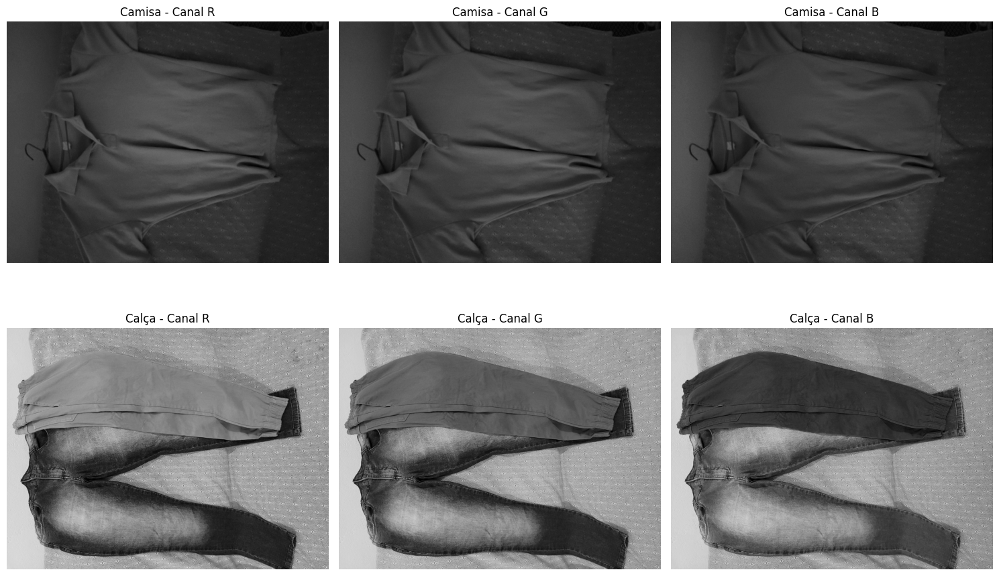

In [13]:
canais_rgb = {
    Classe.CAMISA: [imagem_camisa_rgb[:, :, 0], imagem_camisa_rgb[:, :, 1], imagem_camisa_rgb[:, :, 2]],
    Classe.CALCA: [imagem_calca_rgb[:, :, 0], imagem_calca_rgb[:, :, 1], imagem_calca_rgb[:, :, 2]]
}

nomes_rgb = ["Canal R", "Canal G", "Canal B"]

fig, eixos = plt.subplots(2, 3, figsize=(15, 10))
for linha, classe in enumerate([Classe.CAMISA, Classe.CALCA]):
    for coluna in range(3):
        eixos[linha, coluna].imshow(canais_rgb[classe][coluna], cmap="gray", vmin=0, vmax=255)
        eixos[linha, coluna].set_title(f"{classe} - {nomes_rgb[coluna]}")
        eixos[linha, coluna].axis("off")

plt.tight_layout()
plt.show()

#### Conversão de RGB para escala de cinza

Shape Imagem Camisa em RGB:  (3024, 4032, 3)
Shape Imagem Camisa em Escala de Cinza:  (3024, 4032)
Shape Imagem Calça em RGB:  (3024, 4032, 3)
Shape Imagem Calça em Escala de Cinza:  (3024, 4032)


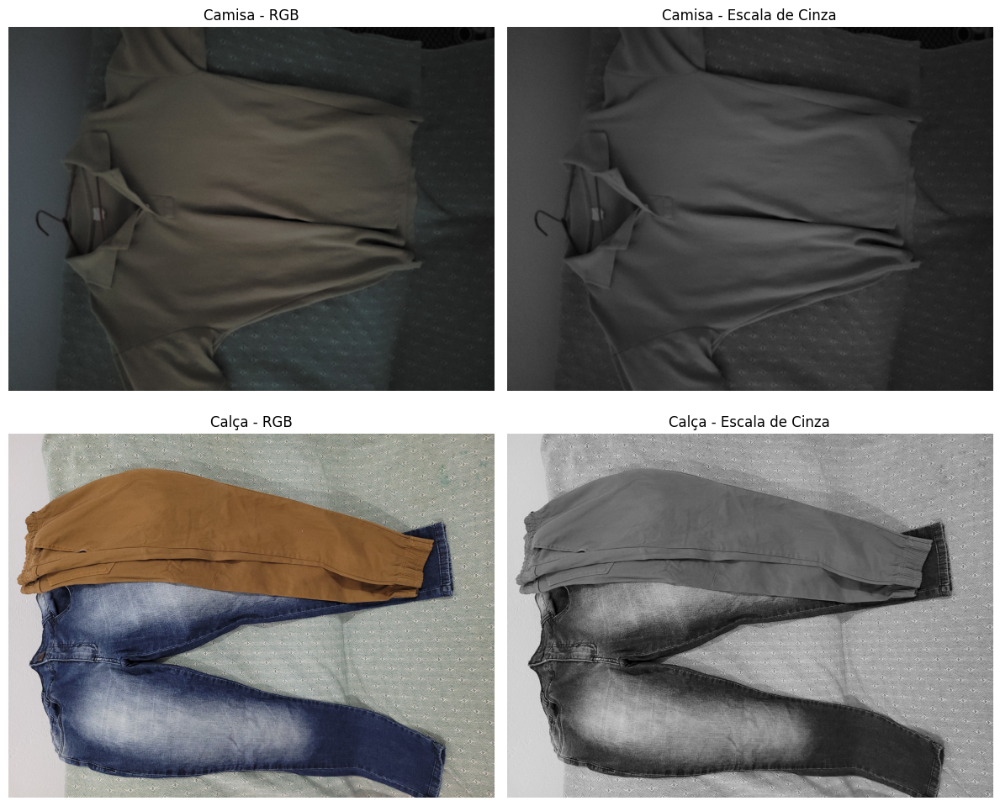

In [14]:
'''Escala de Cinza Classe Camisa'''
imagem_camisa_cinza = cv2.cvtColor(imagem_camisa_rgb, cv2.COLOR_RGB2GRAY)

print("Shape Imagem Camisa em RGB: ", imagem_camisa_rgb.shape)
print("Shape Imagem Camisa em Escala de Cinza: ", imagem_camisa_cinza.shape)

'''Escala de Cinza Classe Calça'''
imagem_calca_cinza = cv2.cvtColor(imagem_calca_rgb, cv2.COLOR_RGB2GRAY)

print("Shape Imagem Calça em RGB: ", imagem_calca_rgb.shape)
print("Shape Imagem Calça em Escala de Cinza: ", imagem_calca_cinza.shape)

fig, eixos = plt.subplots(2, 2, figsize=(12, 10))

imagens_escala_cinza = {
    Classe.CAMISA: [imagem_camisa_rgb, imagem_camisa_cinza],
    Classe.CALCA: [imagem_calca_rgb, imagem_calca_cinza]
}

nomes_cinza = ["RGB", "Escala de Cinza"]

for linha, classe in enumerate([Classe.CAMISA, Classe.CALCA]):
    for coluna, nome in enumerate(nomes_cinza):
        eixos[linha, coluna].imshow(imagens_escala_cinza[classe][coluna],
                                    **({"cmap": "gray", "vmin": 0, "vmax": 255} if nome == nomes_cinza[1] else {}))
        eixos[linha, coluna].set_title(f"{classe} - {nome}")
        eixos[linha, coluna].axis("off")

plt.tight_layout()
plt.show()

#### Conversão de RGB para HSV

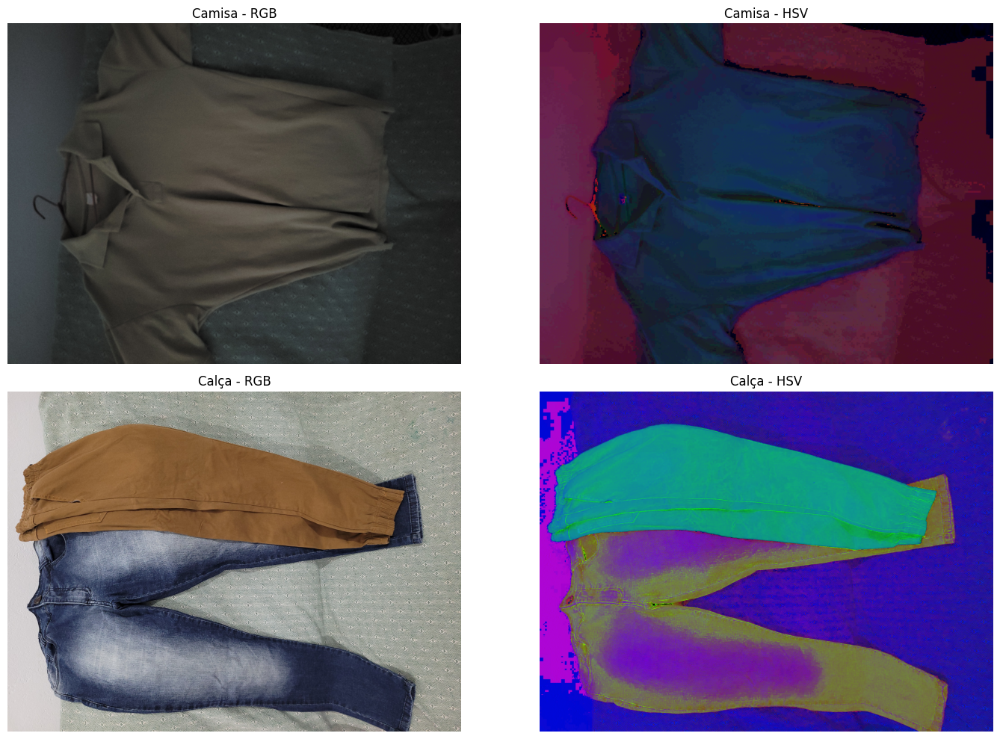

In [15]:
'''HSV Classe Camisa'''

imagem_camisa_hsv = cv2.cvtColor(imagem_camisa_rgb, cv2.COLOR_RGB2HSV)

'''HSV Classe Calça'''
imagem_calca_hsv = cv2.cvtColor(imagem_calca_rgb, cv2.COLOR_RGB2HSV)

imagens_convertidas_hsv = {
    Classe.CAMISA: [
        imagem_camisa_rgb,
        imagem_camisa_hsv
    ],
    Classe.CALCA: [
        imagem_calca_rgb,
        imagem_calca_hsv
    ],
}

nomes_rgb_hsv = ["RGB", "HSV"]

fig, eixos = plt.subplots(2, 2, figsize=(15, 10))
for linha, classe in enumerate([Classe.CAMISA, Classe.CALCA]):
    for coluna, nome in enumerate(nomes_rgb_hsv):
        eixos[linha, coluna].imshow(imagens_convertidas_hsv[classe][coluna],
                                    **({"cmap": "hsv"} if nome == nomes_rgb_hsv[1] else {}))
        eixos[linha, coluna].set_title(f"{classe} - {nome}")
        eixos[linha, coluna].axis("off")

plt.tight_layout()
plt.show()

##### Separação dos canais de cores em HSV

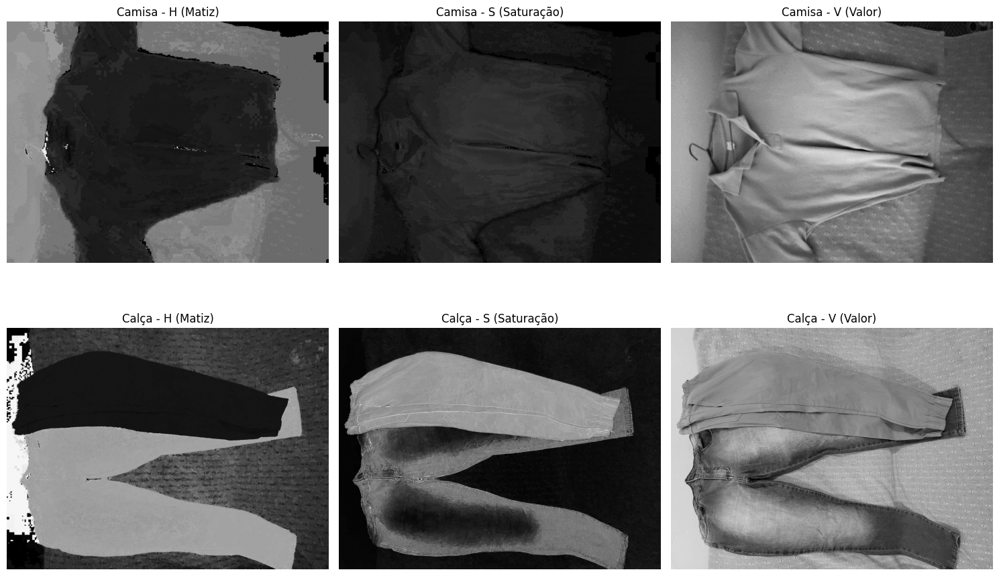

In [16]:
#canal_h_camisa = np.uint8(np.float32(imagem_camisa_hsv[:,:,0]) * (255.0/179.0)) para visualização em escala de cinza
#canal_h_calca = np.uint8(np.float32(imagem_calca_hsv[:,:,0]) * (255.0/179.0)) para visualização em escala de cinza

canais_hsv = {
    Classe.CAMISA: [
        # No opencv o H é representado no intervalo (0 ... 179), assim reescalamos para 0...255
        np.uint8(np.float32(imagem_camisa_hsv[:, :, 0]) * (255.0 / 179.0)),
        imagem_camisa_hsv[:, :, 1],
        imagem_camisa_hsv[:, :, 2]
    ],
    Classe.CALCA: [
        # No opencv o H é representado no intervalo (0 ... 179), assim reescalamos para 0...255
        np.uint8(np.float32(imagem_calca_hsv[:, :, 0]) * (255.0 / 179.0)),
        imagem_calca_hsv[:, :, 1],
        imagem_calca_hsv[:, :, 2]
    ]
}

nomes_hsv = ["H (Matiz)", "S (Saturação)", "V (Valor)"]

fig, eixos = plt.subplots(2, 3, figsize=(15, 10))
for linha, classe in enumerate([Classe.CAMISA, Classe.CALCA]):
    for coluna in range(3):
        eixos[linha, coluna].imshow(canais_hsv[classe][coluna], cmap="gray")
        eixos[linha, coluna].set_title(f"{classe} - {nomes_hsv[coluna]}")
        eixos[linha, coluna].axis("off")

plt.tight_layout()
plt.show()


#### Analise e Interpretação Espaço de Cor

Ao realizar as conversões das imagens das classes Camisa e Calça, foi possível observar diferenças na forma como as informações de cor e intensidade são representadas.

RGB: As imagens carregadas são carregadas por padrão no formato RGB utilizando a biblioteca `Pillow`. Ao visualizar os canais individualmente, é possível perceber que cada um destaca diferentes regiões da imagem de acordo com a quantidade daquela componente de cor. Porem, observou-se uma leve ou quase imperseptivel variação de tonalidade em imagens escuras como a `camisa2.jpg` e `camisa5.jpg`, já em imagens com boa luminosidade ou com tons mais fortes, o impacto de cada canal nas regiões escuras ficam bastante evidentes, porem em regiões mais claras não houve mudança visual perceptivel comparado a imagem original, como observado quando utilizado a imagem `calca4.jpg`.
Essa representação é adequada quando a informação de cor original é importante para a análise, como em classificação de objetos, reconhecimento de produtos e segmentação baseada em cores.

HSV: No espaço HSV, a informação de cor é separada em matiz (H), saturação (S) e valor (V). Visualmente, os canais apresentam uma distribuição diferente daquela observada no RGB. Assim, podemos ver de forma separada a cor, a intensidade da cor e o brilho da imagem. Ao converter a imagem original para o formato HSV, a cor de todos os pixels da imagem foram substituidas, destacando os objetos das classes definidas no dataset. A inversão das cores destacou detalhes imperceptiveis na imagem original, porem em algumas imagens como a `camisa5.jpg` a visualização da textura do tecido ficou prejudicada. O HSV ajuda em tarefas de Visão Computacional que focam na cor, como segmentar e identificar áreas por tonalidade, principalmente quando é necessário separar a informação de tonalidade da iluminação.

Ao observar cada canal do espaço de cor HSV aplicado as imagens do dataset, percebemos que o H (Matiz) destaca os contornos/bordas, delimitando o espaço que o objeto ocupa na imagem, a saturação destaca detelhes internos desses objetos, como manchas e relevos. e o V (Valor) mantem a textura dos objetos.

Escala de cinza:
Na escala de cinza, as informações de cor são removidas e a imagem passa a ser representada apenas por diferentes níveis de intensidade, variando entre regiões mais escuras e mais claras. Assim, a imagem tem apenas um canal, ao invés dos três do RGB. Com isso, detalhes relacionados à forma, contornos e textura continuam presentes, mas as diferenças de cor deixam de ser utilizadas. Essa representação pode ser utilizada em tarefas como detecção de bordas, análise de formas, reconhecimento de padrões e processamento de imagens em que a cor não é essencial.

Observação: Em algumas imagens ao converter do RGB para Escala de Cinza, alguns objetos da imagem resultante apresentaram tonalidade puxada para o verde. Nesse caso, o ocorrido pode apenas ter sido uma persepção gerada pelo tipo de gama de cores presentes em um dos monitores conectados ao disposito (DCI-P3) ou por filtros de luz/cor ativados no dispositivo.

Comparação

De maneira geral, o RGB preserva melhor a informação de cor original da imagem, o HSV facilita a análise separando tonalidade, saturação e luminosidade, enquanto a escala de cinza simplifica a imagem concentrando-se nas informações de intensidade, formas e contornos. Portanto, a escolha do espaço de cor deve depender da característica que se deseja utilizar na tarefa de Processamento de Imagens ou Visão Computacional.
Quando usamos o espaço RGB, a imagem continua com a mesma aparência graças aos canais vermelho, verde e azul. Essa forma mantém as informações de cor das peças e funciona bem em tarefas onde as cores são essenciais para distinguir as classes.

 ### C. Quantização

A quantização reduz a quantidade de níveis de intensidade disponíveis para representar os pixels.

Serão comparadas imagens em:

- 256 níveis;
- 64 níveis;
- 32 níveis;
- 2 níveis de cinza.

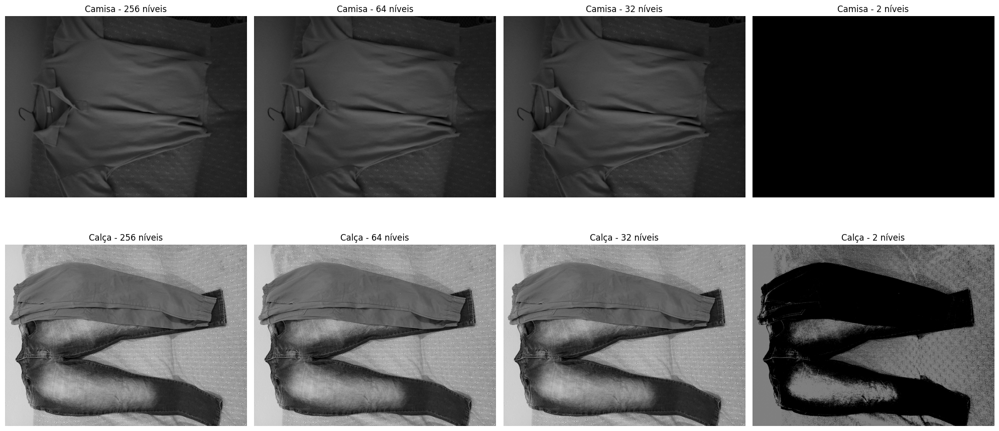

In [17]:
def quantizar_imagem(imagem: np.ndarray, niveis: int) -> np.ndarray:
    passo = 256 / niveis
    resultado = np.clip(np.floor(imagem.astype(np.float32) / passo) * passo, 0, 255)
    return resultado.astype(np.uint8)

imagens_quantizadas = {
    Classe.CAMISA: [
        quantizar_imagem(imagem_camisa_cinza, 256),
        quantizar_imagem(imagem_camisa_cinza, 64),
        quantizar_imagem(imagem_camisa_cinza, 32),
        quantizar_imagem(imagem_camisa_cinza, 2),
    ],
    Classe.CALCA: [
        quantizar_imagem(imagem_calca_cinza, 256),
        quantizar_imagem(imagem_calca_cinza, 64),
        quantizar_imagem(imagem_calca_cinza, 32),
        quantizar_imagem(imagem_calca_cinza, 2)
    ],
}

niveis = [256, 64, 32, 2]

fig, eixos = plt.subplots(2, 4, figsize=(20, 10))
for linha, classe in enumerate([Classe.CAMISA, Classe.CALCA]):
    for coluna, nivel in enumerate(niveis):
        eixos[linha, coluna].imshow(imagens_quantizadas[classe][coluna], cmap="gray", vmin=0, vmax=255)
        eixos[linha, coluna].set_title(f"{classe} - {nivel} níveis")
        eixos[linha, coluna].axis("off")

plt.tight_layout()
plt.show()




### Análise da quantização

Com **256 níveis**, a variação de intensidade é preservada de forma mais completa.

Em **64 níveis**, algumas diferenças de intensidade são agrupadas, mas a imagem ainda conserva boa quantidade de informação.

Com **32 níveis**, as transições entre tons ficam mais marcadas e a perda de detalhes tonais é mais perceptível.

Com **2 níveis**, a representação fica praticamente binária, preservando principalmente regiões claras e escuras. Muitos detalhes são perdidos. Alem disso, imagens com luminosidade baixa ficaram totalmente escuras.

Para o dataset com imagens de Camisas e Calças, **256 níveis** é a alternativa mais segura para preservar informações visuais, permitindo a aplicação das imagens em modelos de detecção de objetos como os baseados em CNNs. Quantizações menores podem ser úteis em aplicações específicas, como análise de silhuetas, segmentação ou processamento baseado principalmente em forma e contraste.

### D. Formato de Arquivo

In [18]:
Image.fromarray(imagem_camisa_rgb).save(get_caminho_output("camisa_rgb.jpg"), format="JPEG", quality=50)
Image.fromarray(imagem_camisa_rgb).save(get_caminho_output("camisa_rgb.png"), format="PNG")
tamanho_camisa_jpeg = os.path.getsize(get_caminho_output("camisa_rgb.jpg"))
tamanho_camisa_png = os.path.getsize(get_caminho_output("camisa_rgb.png"))
print(f"Imagem Camisa -> JPEG: {tamanho_camisa_jpeg / 1024:.2f} KB")
print(f"Imagem Camisa -> PNG: {tamanho_camisa_png / 1024:.2f} KB")

Image.fromarray(imagem_calca_rgb).save(get_caminho_output("calca_rgb.jpg"), format="JPEG", quality=50)
Image.fromarray(imagem_calca_rgb).save(get_caminho_output("calca_rgb.png"), format="PNG")
tamanho_calca_jpeg = os.path.getsize(get_caminho_output("calca_rgb.jpg"))
tamanho_calca_png = os.path.getsize(get_caminho_output("calca_rgb.png"))
print(f"Imagem Calça -> JPEG: {tamanho_calca_jpeg / 1024:.2f} KB")
print(f"Imagem Calça -> PNG: {tamanho_calca_png / 1024:.2f} KB")

Imagem Camisa -> JPEG: 630.32 KB
Imagem Camisa -> PNG: 10987.95 KB
Imagem Calça -> JPEG: 1618.42 KB
Imagem Calça -> PNG: 18562.43 KB


##### Analise e Interpretação

No experimento, o JPEG apresentou tamanho menor que o PNG. Isso ocorre porque o JPEG utiliza compressão com perdas, descartando parte da informação para reduzir o tamanho do arquivo. Dependendo da compressão, podem surgir artefatos em bordas, texturas e regiões detalhadas.
O PNG utiliza compressão sem perdas, preservando os pixels da imagem, porém pode gerar arquivos maiores.

Foi possível perceber visualmente que a imagem JPEG, especialmente utilizando compressão de 50%, apresenta maior perda de detalhes em regiões com texturas e estampas. Ao utilizar zoom, também podem ser percebidos artefatos decorrentes da compressão, principalmente em bordas e regiões com maior quantidade de detalhes. Entre os artefatos encontrados podemos citar pontos com agrupamento exagerado de pixels gerando, borrões na imagem.

Já as imagens armazenas em formato PNG preservou todos os detalhes da imagem original, premitindo maior profundidade de ampliação via zoom, quanto as armazenadas em JPEG com compressão de 50%.

Dependendo da tarefa de PDI, utlizar imagens JPEG com alto indice de compressão pode ser prejudicial ou custoso, pois nesse contexto a compressão cria falsas informações nos pixels, gerando ruidos na imagem. Tambem pode causar baixa nitidez em bordas, gerando borrões. Nesse caso algoritmos de segmentação e detecção podem falhar, pois ficam confusos os borrões presentes na imagem. Para solucionar alguns dos problemas causados pela compressão, pode ser necessario aplicar a imagem a processos avançados que utilizam de inteligencia artificial para corrigir os pixels, o que demanda alto poder computacional.